In [1]:
import numpy as np
import cv2
import os
from scipy.spatial import distance
from sklearn.metrics import accuracy_score
from scipy import ndimage
from sklearn.pipeline import make_pipeline
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt

In [2]:
def get_images(pw, color):
    img_dict = {}
    categories = []
    images = []
    for it in os.scandir(pw):
        img_list = []
        if it.is_dir():
            cate = it.path.split('/')[2]
            categories.append(cate)
            for file in os.listdir(it.path):
                if file.endswith(".jpg"):
                    img = cv2.imread(os.path.join(it.path, file),0)
                    if(color):
                        img = cv2.imread(os.path.join(it.path, file))
                        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB )
                    img = cv2.resize(img, (150,150))
                    img_list.append(img)
                    img_dict[cate] = np.array(img_list)
                    images.append(img)
                    
    return img_dict, images, categories


In [3]:
# perform dense sift
def compute_key_points(img):
        h = img.shape[0]
        w = img.shape[1]
        step = 8
        radius = 8
        key_points = []
        for i in range(0, h, step):
            for j in range(0, w, step):
                key_points.append(cv2.KeyPoint(i, j, radius))
        return key_points
    
def compute_features(img,key_points):
    sift = cv2.SIFT_create()
    features = sift.compute(img, key_points)
    return features


In [4]:
from sklearn.multiclass import OneVsRestClassifier

In [5]:
def sift_features(images):
    descriptor_list = []
    sift_vectors = {}
    sift = cv2.SIFT_create()
    
    for key in images:
        res = 0
        features = []
        for img in images[key]:
            key_points = compute_key_points(img)
            kp, des = compute_features(img,key_points)
            features.append(des)
            if(len(des)):
                res += 1
            descriptor_list.extend(des)
        sift_vectors[key] = features
    return [descriptor_list, sift_vectors]

def createHisto(bovw_feature, descriptor_list, centers, kmeans, normalize):
    cateWise_features = {}
    histograms = []
    num_centers = len(centers)
    for key in bovw_feature:
        cate = []
        
        for features in bovw_feature[key]:
            histogram = np.zeros(num_centers)
            features = np.array(features, dtype='float')
            indices = kmeans.predict(features)
            for ind in indices:
                histogram[ind] = histogram[ind]+1
            if(normalize):
                normalized_histo = histogram/np.sum(histogram)
                cate.append(normalized_histo)
            else:
                histograms.append(histogram)
                cate.append(histogram)    
        
        cateWise_features[key] = cate
    return cateWise_features, histograms



def create_bovw(images, test, num_clusters, normalize_histo= False):
    des_list, all_bovw_features = sift_features(images) 
    _, test_bovw_features = sift_features(test)
    # Returns a dictionary that holds the histograms for each images that are separated class by class. 
    kmeans = KMeans(n_clusters = num_clusters, n_init=10)
    kmeans.fit(des_list)
    centers = kmeans.cluster_centers_ 
    # Creates normalize histograms for train data    
    bovw_train, histograms= createHisto(all_bovw_features, des_list, centers, kmeans, normalize_histo) 
    # Creates normalize histograms for test data
    bovw_test, histograms = createHisto(test_bovw_features, des_list, centers, kmeans, normalize_histo)
    return bovw_train, bovw_test, histograms

def getXY(bovw):
    histo = []
    categ = []
    for key in bovw:
        for h in bovw[key]:
            histo.append(h)
            categ.append(key)
    return histo, categ 

def classify(c, plot=True):
    clf = OneVsRestClassifier(LinearSVC(penalty = 'l2', C = c, tol = 0.001))
    clf.fit(X_train, y_train)
    y_pred  = clf.predict(X_test)
    if(plot):
        plot_confusion_matrix(clf, X_test, y_test) 
    return y_pred

def get_metrics(y_pred, y_test): 
    cm = confusion_matrix(y_test, y_pred)
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    class_wise_acc = cm.diagonal()
    accuracy = accuracy_score(y_test, y_pred)
    return class_wise_acc, accuracy


def display_img_arr(img_arr, r, c, dim,titles_arr):
    fl = 0
    fig = plt.figure(figsize = dim)
    for i in range(r):
        for j in range(c):
            if len(img_arr) == fl:
                break
            ax1 = fig.add_subplot(r, c, fl + 1)
            ax1.set_title(titles_arr[fl], fontsize = 20)
            ax1.imshow(img_arr[fl], cmap = 'gray')
            fl = fl + 1
    plt.show()

50 clusters of k-meams | **with histogram normalization** | with color | lambdaa = 1.0

In [5]:

train_imgsbycate, train_img_list, categories = get_images('dataset/train',1)  # take all images category by category 
test_imgsbycate, test_img_list, _  = get_images("dataset/test",1) # take test images 
 
bovw_train, bovw_test, histograms = create_bovw(train_imgsbycate, test_imgsbycate, 50,normalize_histo=True)


In [6]:
X_train, y_train = getXY(bovw_train)
X_test, y_test = getXY(bovw_test)


class wise accuracies
highway: 35.0
park: 55.00000000000001
kitchen: 55.00000000000001
waterfall: 30.0
windmill: 70.0
laundromat: 80.0
desert: 15.0
aquarium: 50.0
overall accuracy 48.75


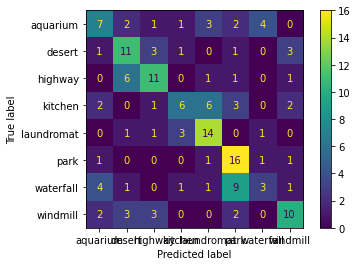

In [13]:
lambdaa = 1.0
y_pred = classify(lambdaa)   
class_wise_acc, accuracy = get_metrics(y_pred, y_test)
print("class wise accuracies")
for i,c in enumerate(categories):
    print(str(c)+": "+str(class_wise_acc[i]*100))
    
print("overall accuracy", accuracy*100)   


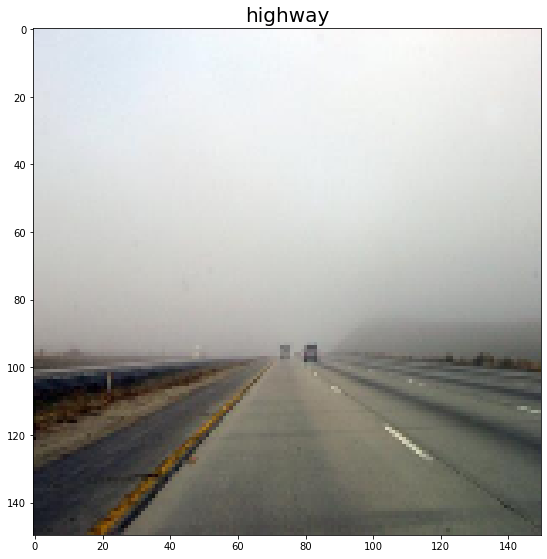

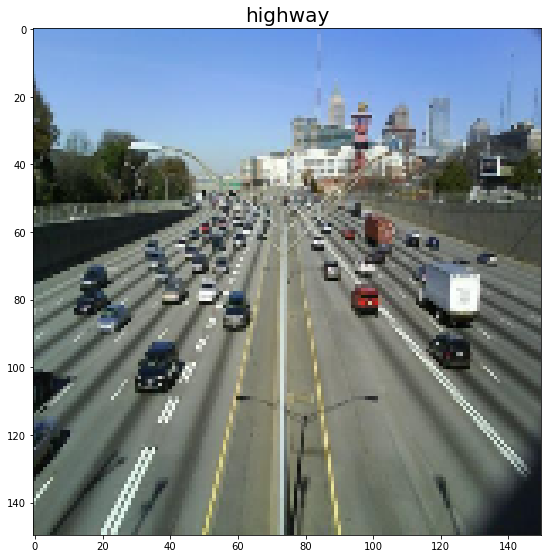

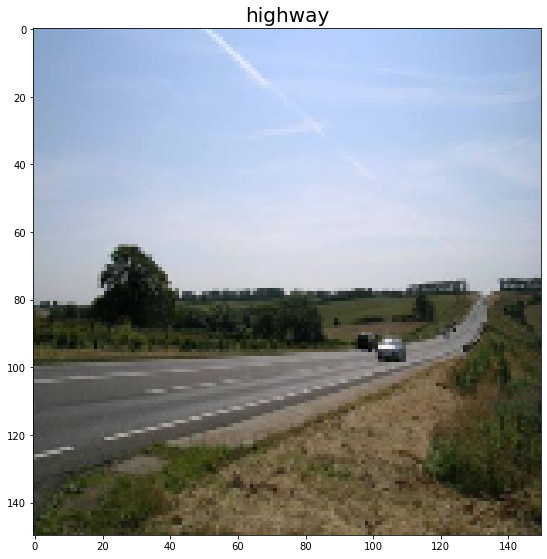

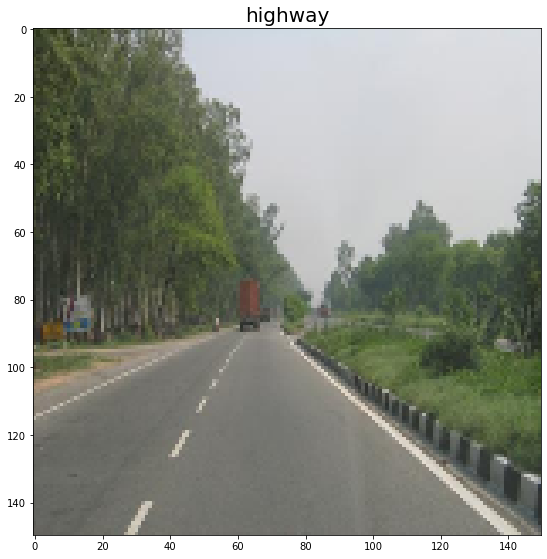

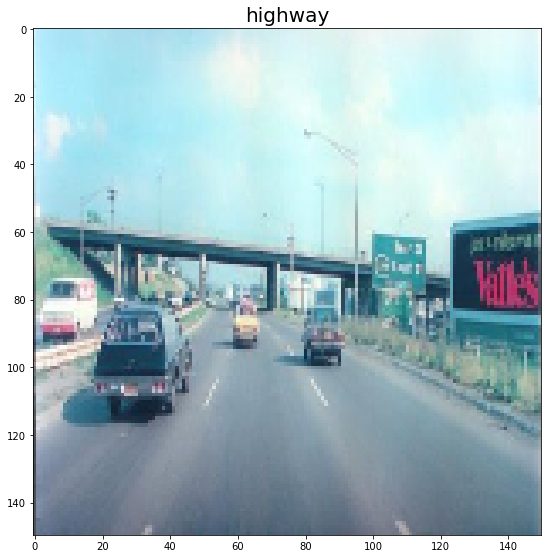

...

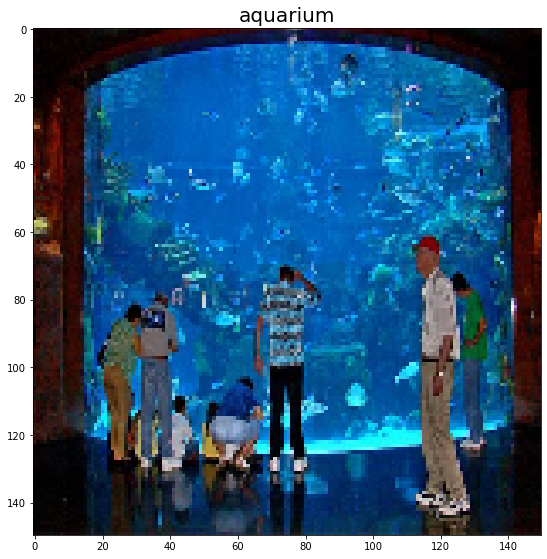

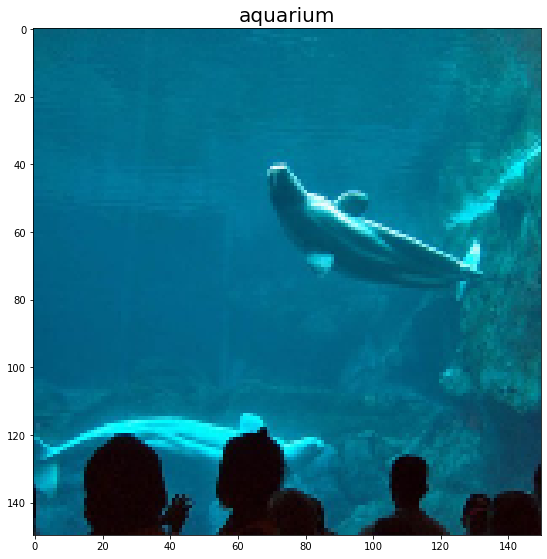

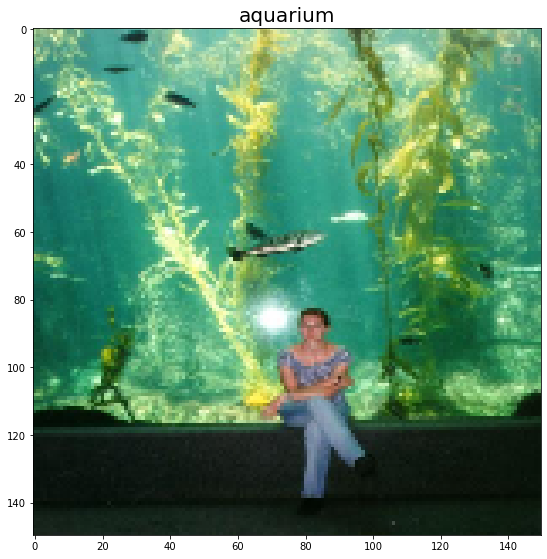

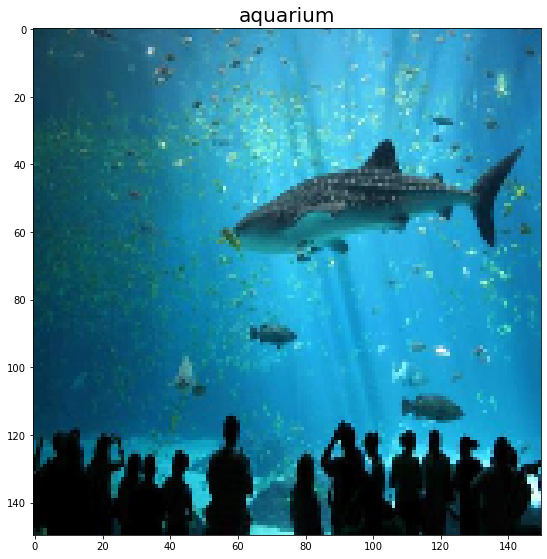

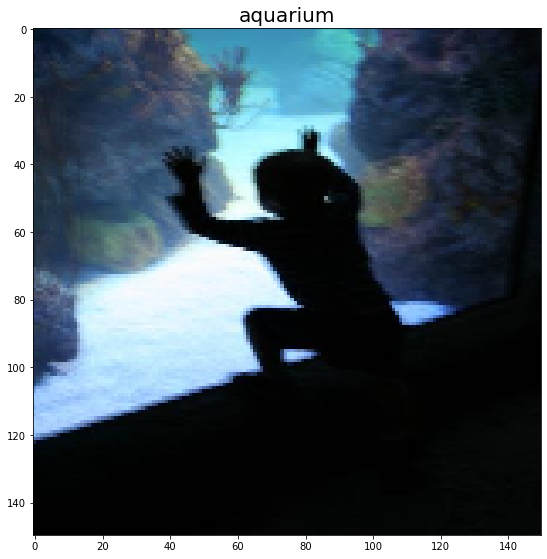

In [14]:
# correctly classified
correct_classified_ind = np.where(y_test == y_pred)[0].astype(int)
for ind in correct_classified_ind:
    display_img_arr([test_img_list[ind]], 1, 2, (20, 20), [y_pred[ind]])

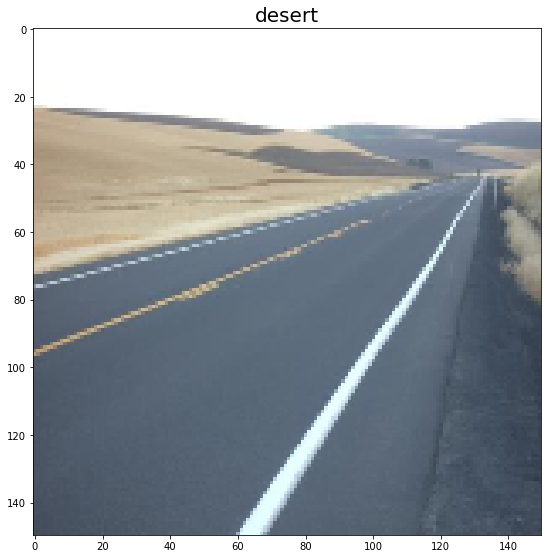

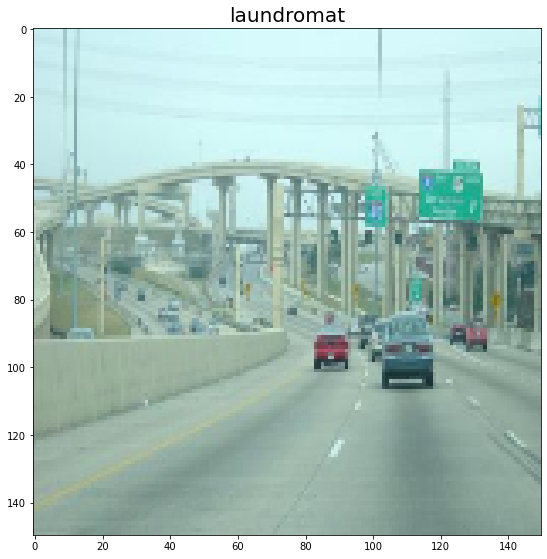

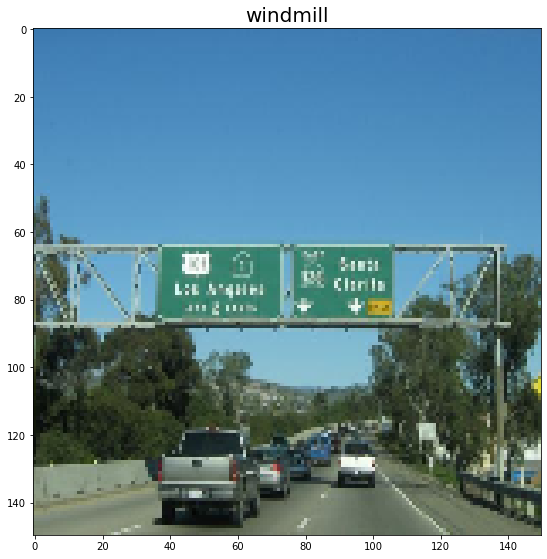

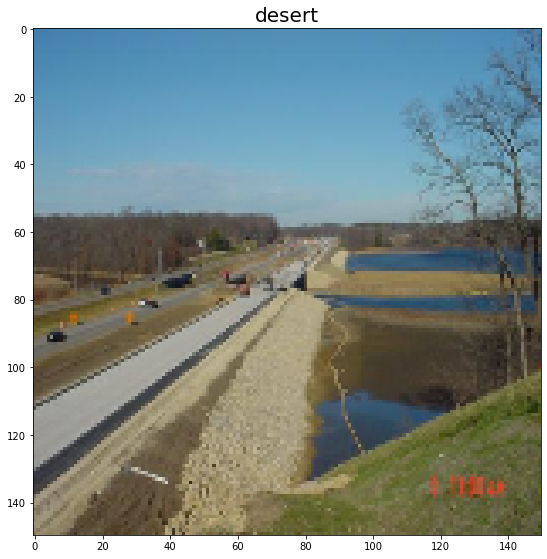

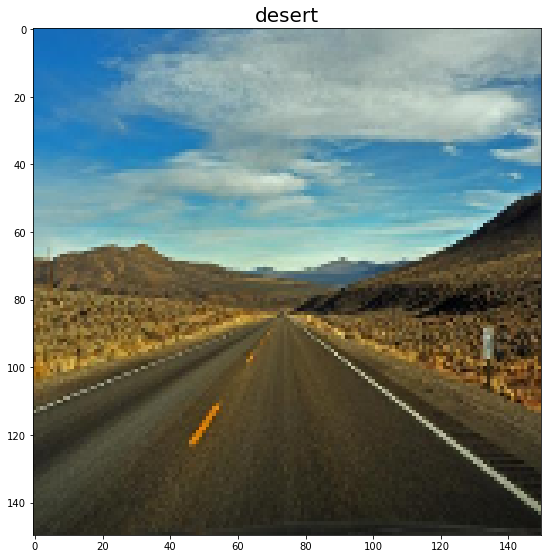

...

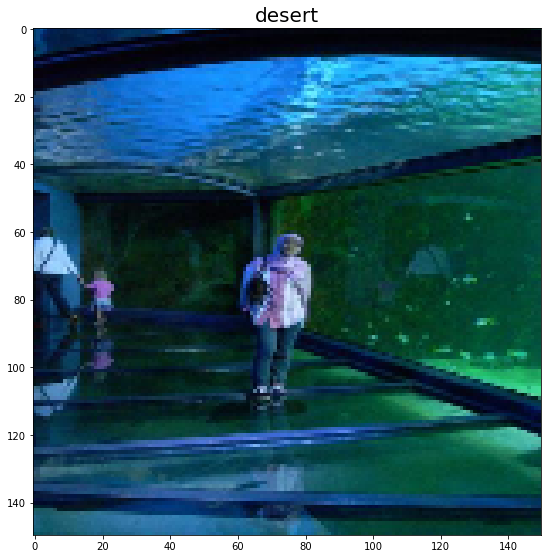

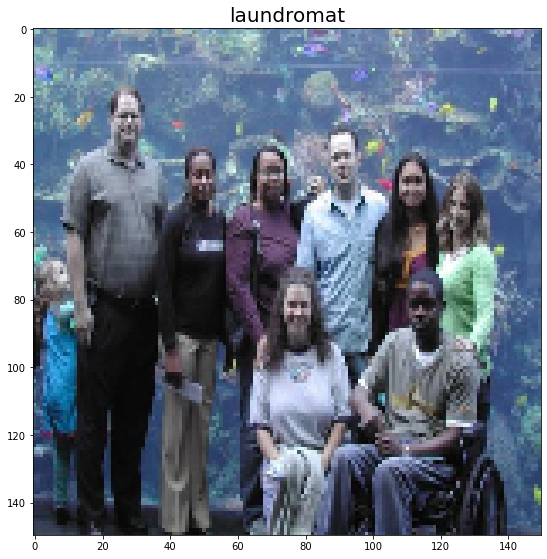

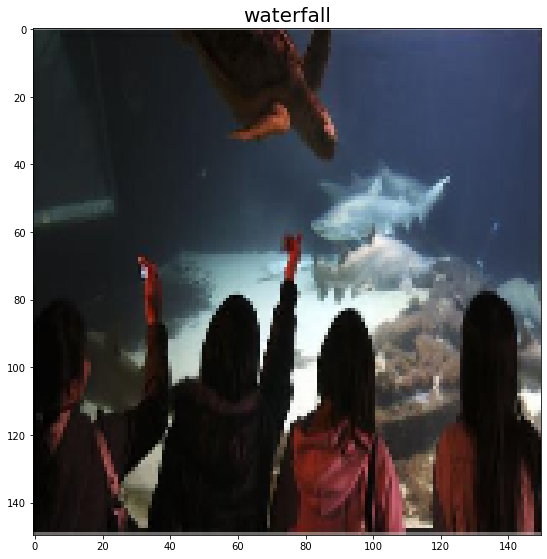

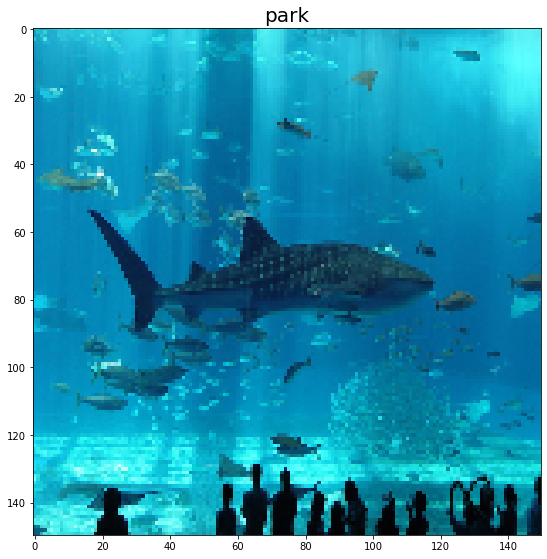

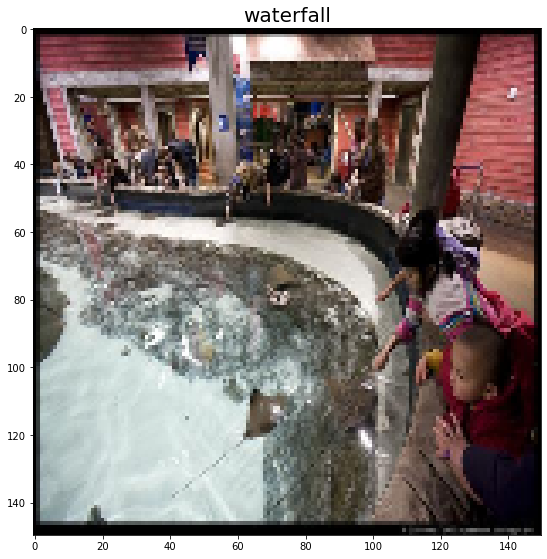

In [16]:
# wrong classified
wrong_classified_ind = np.where(y_test != y_pred)[0].astype(int)
for ind in wrong_classified_ind:
    display_img_arr([test_img_list[ind]], 1, 2, (20, 20), [y_pred[ind]])


Tuning regularization parameter lmabmda

In [17]:
lambdaas = [0.5, 1.0, 1.5, 2.0, 5.0, 10.0, 20.0, 100, 200]
for lambdaa in lambdaas:
    y_pred = classify(lambdaa, plot=False)   
    class_wise_acc, accuracy = get_metrics(y_pred, y_test)  
    print("lambda: ",lambdaa)
    print("class wise accuracies")
    for i,c in enumerate(categories):
        print(str(c)+": "+str(class_wise_acc[i]*100))
    print("overall accuracy", accuracy*100)   


lambda:  0.5
class wise accuracies
highway: 30.0
park: 55.00000000000001
kitchen: 50.0
waterfall: 25.0
windmill: 70.0
laundromat: 85.0
desert: 20.0
aquarium: 50.0
overall accuracy 48.125
lambda:  1.0
class wise accuracies
highway: 35.0
park: 55.00000000000001
kitchen: 55.00000000000001
waterfall: 30.0
windmill: 70.0
laundromat: 80.0
desert: 15.0
aquarium: 50.0
overall accuracy 48.75
lambda:  1.5
class wise accuracies
highway: 35.0
park: 45.0
kitchen: 50.0
waterfall: 30.0
windmill: 70.0
laundromat: 85.0
desert: 20.0
aquarium: 60.0
overall accuracy 49.375
lambda:  2.0
class wise accuracies
highway: 35.0
park: 45.0
kitchen: 50.0
waterfall: 30.0
windmill: 70.0
laundromat: 85.0
desert: 20.0
aquarium: 60.0
overall accuracy 49.375
lambda:  5.0
class wise accuracies
highway: 35.0
park: 50.0
kitchen: 55.00000000000001
waterfall: 35.0
windmill: 70.0
laundromat: 90.0
desert: 20.0
aquarium: 60.0
overall accuracy 51.87500000000001
lambda:  10.0
class wise accuracies
highway: 30.0
park: 40.0
kitchen

/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge

lambda:  100
class wise accuracies
highway: 30.0
park: 40.0
kitchen: 55.00000000000001
waterfall: 30.0
windmill: 55.00000000000001
laundromat: 95.0
desert: 20.0
aquarium: 60.0
overall accuracy 48.125


/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


lambda:  200
class wise accuracies
highway: 20.0
park: 35.0
kitchen: 60.0
waterfall: 30.0
windmill: 60.0
laundromat: 90.0
desert: 20.0
aquarium: 55.00000000000001
overall accuracy 46.25


/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


for lambda = 5.0, overall accuracy 51.87500000000001

hence, lambda = 5.0 gives best till now

50 clusters of k-meams | **without histogram normalization** | with color

/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge

class wise accuracies
highway: 30.0
park: 85.0
kitchen: 40.0
waterfall: 75.0
windmill: 15.0
laundromat: 50.0
desert: 5.0
aquarium: 50.0
overall accuracy 43.75


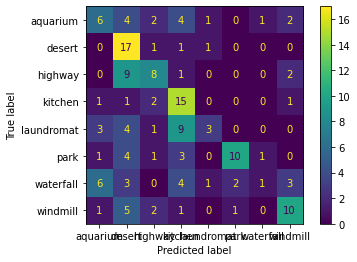

In [18]:
bovw_train, bovw_test, _ = create_bovw(train_imgsbycate, test_imgsbycate, 50,normalize_histo=False)

X_train, y_train = getXY(bovw_train)
X_test, y_test = getXY(bovw_test)

y_pred = classify(5.0)   
class_wise_acc, accuracy = get_metrics(y_pred, y_test)
print("class wise accuracies")
for i,c in enumerate(categories):
    print(str(c)+": "+str(class_wise_acc[i]*100))

print("overall accuracy", accuracy*100)   


**100 clusters of k-meams** | without histogram normalization | with color

/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge

class wise accuracies
highway: 30.0
park: 40.0
kitchen: 25.0
waterfall: 55.00000000000001
windmill: 40.0
laundromat: 70.0
desert: 30.0
aquarium: 50.0
overall accuracy 42.5


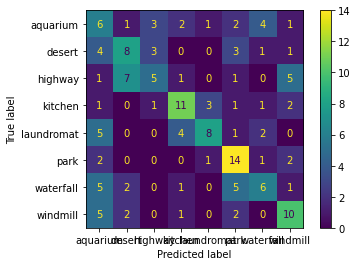

In [19]:
bovw_train, bovw_test, _= create_bovw(train_imgsbycate, test_imgsbycate, 100,normalize_histo=False)

X_train, y_train = getXY(bovw_train)
X_test, y_test = getXY(bovw_test)

y_pred = classify(5.0)   
class_wise_acc, accuracy = get_metrics(y_pred, y_test)
print("class wise accuracies")
for i,c in enumerate(categories):
    print(str(c)+": "+str(class_wise_acc[i]*100))

print("overall accuracy", accuracy*100)   

**35 clusters of k-meams** | without histogram normalization | with color

/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/home/avani/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge

class wise accuracies
highway: 0.0
park: 40.0
kitchen: 40.0
waterfall: 70.0
windmill: 30.0
laundromat: 45.0
desert: 0.0
aquarium: 50.0
overall accuracy 34.375


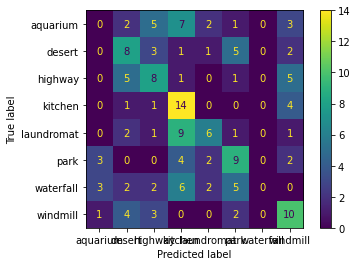

In [20]:
bovw_train, bovw_test, _ = create_bovw(train_imgsbycate, test_imgsbycate, 35,normalize_histo=False)

X_train, y_train = getXY(bovw_train)
X_test, y_test = getXY(bovw_test)

y_pred = classify(5.0)   
class_wise_acc, accuracy = get_metrics(y_pred, y_test)
print("class wise accuracies")
for i,c in enumerate(categories):
    print(str(c)+": "+str(class_wise_acc[i]*100))

print("overall accuracy", accuracy*100)   

As we see, accuracy decreases without normalization

**200 clusters of k-meams** | **with histogram normalization** | with color

class wise accuracies
highway: 65.0
park: 55.00000000000001
kitchen: 65.0
waterfall: 85.0
windmill: 80.0
laundromat: 100.0
desert: 25.0
aquarium: 75.0
overall accuracy 68.75


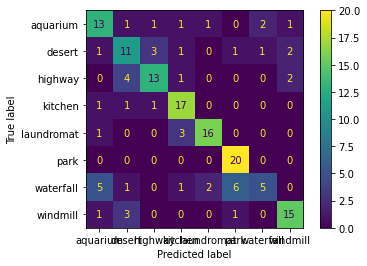

In [22]:

bovw_train, bovw_test, histograms = create_bovw(train_imgsbycate, test_imgsbycate, 200,normalize_histo=True)

X_train, y_train = getXY(bovw_train)
X_test, y_test = getXY(bovw_test)

y_pred = classify(5.0)   
class_wise_acc, accuracy = get_metrics(y_pred, y_test)
print("class wise accuracies")
for i,c in enumerate(categories):
    print(str(c)+": "+str(class_wise_acc[i]*100))

print("overall accuracy", accuracy*100)   

## Bonus

In [24]:
def reweight_tf_idf(histograms):
    pos_hists = histograms > 0
    n_i = np.sum(pos_hists, axis=0)
    dn  = 0
    N, H = histograms.shape
    new_hists  = np.zeros((N, H))
    temp = 1
    
    for hid in range(N):
        n = 0
        n_deno  = np.sum(histograms[hid])
        temp = 0
        for bid in range(len(histograms[hid])): 
            temp = N/n_i[bid]
            n = np.log(temp)
            new_hists[hid, bid] = n*histograms[hid, bid]/ n_deno 
    return new_hists 


In [25]:
def createHistoReWeighted(bovw_feature, descriptor_list, centers, kmeans, normalize):
    cateWise_features = {}
    histograms = []
    num_centers = len(centers)
    for key in bovw_feature:
        cate = []
        
        for features in bovw_feature[key]:
            histogram = np.zeros(num_centers)
            features = np.array(features, dtype='float')
            indices = kmeans.predict(features)
            for ind in indices:
                histogram[ind] = histogram[ind]+1
            if(normalize):
                normalized_histo = histogram/np.sum(histogram)
                cate.append(normalized_histo)
            else:
                histograms.append(histogram)
                cate.append(histogram)    
        
        cateWise_features[key] = cate
    return cateWise_features, histograms

In [26]:

train_imgsbycate, train_img_list, categories = get_images('dataset/train',1)  # take all images category by category 
test_imgsbycate, test_img_list, _  = get_images("dataset/test",1) # take test images 
 
bovw_train, bovw_test, histograms = create_bovw(train_imgsbycate, test_imgsbycate, 200,normalize_histo=False)

histos = []
for k in bovw_train:
    histos.extend(bovw_train[k])
    
histo_reweighted  = reweight_tf_idf(np.array(histos))
j = 0
for k in bovw_train:
    for i in range(len(bovw_train)):
        bovw_train[k][i] = histo_reweighted[j] 

In [27]:
histos = []
for k in bovw_test:
    histos.extend(bovw_test[k])
    
histo_reweighted  = reweight_tf_idf(np.array(histos))
j = 0
for k in bovw_train:
    for i in range(len(bovw_train)):
        bovw_test[k][i] = histo_reweighted[j] 

class wise accuracies
highway: 40.0
park: 35.0
kitchen: 40.0
waterfall: 40.0
windmill: 30.0
laundromat: 80.0
desert: 5.0
aquarium: 50.0
overall accuracy 40.0


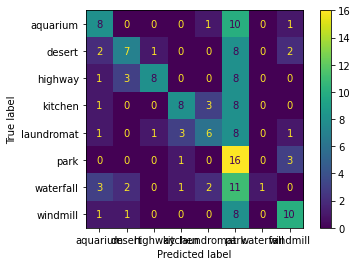

In [28]:
X_train, y_train = getXY(bovw_train)
X_test, y_test = getXY(bovw_test)

y_pred = classify(5.0)   
class_wise_acc, accuracy = get_metrics(y_pred, y_test)
print("class wise accuracies")
for i,c in enumerate(categories):
    print(str(c)+": "+str(class_wise_acc[i]*100))

print("overall accuracy", accuracy*100)   

        